# Group project - plant Pathology 2021
## Identify the category of foliar diseases in apple trees
### CPE 695A - Applied Machine Learning
### Semester Group project
### Basic Keras Sequential Model from scratch

In [1]:
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import StratifiedKFold
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import tensorflow as tf
import albumentations as A
import pandas as pd
import numpy as np
import shutil
import os
import seaborn as sns
import keras
from keras.preprocessing import image
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten,Dense,Dropout,BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, InceptionResNetV2, ResNet50, Xception
import cv2
from PIL import Image

ImportError: cannot import name 'get_config' from 'tensorflow.python.eager.context' (C:\Users\ashis\AppData\Roaming\Python\Python38\site-packages\tensorflow\python\eager\context.py)

In [2]:
from tqdm import tqdm

### CONFIGURATION
#### Make changes here to customize the entire notebook

In [3]:
plt.style.use('fivethirtyeight')
print(f'Using TensorFlow {tf.__version__}')

class CFG:
    
    '''
    keep these
    '''
    root = '/Users/ashis/Downloads/3 - Applied Machine Learning CPE 695A/Kaggle/ML Group Project - Dataset/train_images'
    
    classes = [
        'complex', 
        'frog_eye_leaf_spot', 
        'powdery_mildew', 
        'rust', 
        'scab',
        'healthy']
    
    strategy = tf.distribute.get_strategy()
    
    batch_size = 16
    
    '''
    tune these
    '''
    img_size = 512 # image size
    folds = 5 # number of KFold n_splits
    seed = 42 # random seed (only for KFold)
    subfolds = 16 # number of .tfrec files in each fold
    transform = True # whether to apply pre-augmentations or not
    epochs = 5 # (>=5) number of pre-augmented dataset copies to save when transform = True

Using TensorFlow 2.3.0


In [4]:
CFG.root

'/Users/ashis/Downloads/3 - Applied Machine Learning CPE 695A/Kaggle/ML Group Project - Dataset/train_images'

In [5]:
df = pd.read_csv('/Users/ashis/Downloads/3 - Applied Machine Learning CPE 695A/Kaggle/ML Group Project - Dataset/train.csv',index_col='image')

In [6]:
init_len = len(df)

with open('/Users/ashis/Downloads/3 - Applied Machine Learning CPE 695A/Kaggle/ML Group Project - Dataset/duplicates.csv', 'r') as file:
    duplicates = [x.strip().split(',') for x in file.readlines()]

In [7]:
for row in duplicates:
    unique_labels = df.loc[row].drop_duplicates().values
    if len(unique_labels) == 1:
        df = df.drop(row[1:], axis=0)
    else:
        df = df.drop(row, axis=0)
        
print(f'Dropping {init_len - len(df)} duplicate samples.')

Dropping 83 duplicate samples.


In [8]:
DATA_OUTPUT = '/Users/ashis/Downloads/3 - Applied Machine Learning CPE 695A/Kaggle/ML Group Project - Dataset/'

In [9]:
DATA_TRAIN_IMAGES_256 = os.path.join(DATA_OUTPUT, 'train_images_256')

### Resizing Images and saving in a subfolder within the current working directory 

In [10]:
def show_img(image):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

In [11]:
def resize_images(path_in:str, path_out:str, filenames:list, resize_to:dict):
    if not os.path.isdir(path_out): os.mkdir(path_out)
    
    trfTranspose = A.Transpose(p=1)
    trfResize = A.Resize (height=resize_to['height'], width=resize_to['width'], p=1)
    for filename in tqdm(filenames):
        image = cv2.imread( os.path.join(path_in, filename) )
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        height, width, _ = image.shape
        if height/width > 1: image = trfTranspose(image=image)['image']
        
        image_resized = trfResize(image=image)['image']
        
        save_to = os.path.join(path_out, filename)
        image_resized = cv2.cvtColor(image_resized, cv2.COLOR_RGB2BGR)
        if not cv2.imwrite(filename=save_to, img=image_resized): print(f'Failed to save image: {filename} to dir:{path_out}')

In [12]:
filenames = df.index.tolist()

In [13]:
resize_to_256x256={'height':256, 'width':256, 'dir':DATA_TRAIN_IMAGES_256}

In [ ]:
%%time
resize_images(path_in=CFG.root, path_out=resize_to_256x256['dir'], 
              filenames=filenames, resize_to=resize_to_256x256)

In [14]:
df = df.reset_index()

In [15]:
df.labels.value_counts()

scab                               4818
healthy                            4624
frog_eye_leaf_spot                 3180
rust                               1815
complex                            1580
powdery_mildew                     1184
scab frog_eye_leaf_spot             686
scab frog_eye_leaf_spot complex     200
frog_eye_leaf_spot complex          165
rust frog_eye_leaf_spot             119
rust complex                         91
powdery_mildew complex               87
Name: labels, dtype: int64

In [16]:
df['labels'].unique()

array(['healthy', 'scab frog_eye_leaf_spot complex', 'scab', 'complex',
       'rust', 'frog_eye_leaf_spot', 'powdery_mildew',
       'scab frog_eye_leaf_spot', 'frog_eye_leaf_spot complex',
       'rust frog_eye_leaf_spot', 'powdery_mildew complex',
       'rust complex'], dtype=object)

In [17]:
df['labels'] = df['labels'].astype(str)

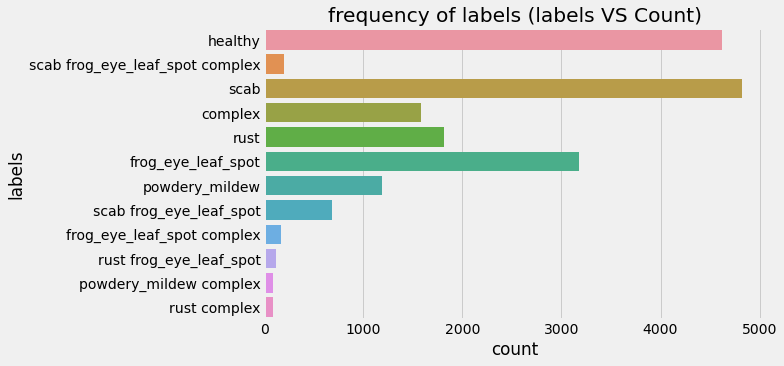

In [18]:
plt.figure(figsize=(8,5))
sns.countplot(data = df,y='labels')
plt.title('frequency of labels (labels VS Count)')

plt.savefig('labels.png',bbox_inches = 'tight')

In [19]:
def plot_examples(label):
    fig, ax = plt.subplots(1, 5, figsize=(25, 15))
    ax = ax.ravel()
    for i in range(5):
        idx = df[df['labels']==label].index[i]
        image = cv2.imread(resize_to_256x256['dir']+'/'+df.loc[idx, 'image'])
        image =cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax[i].imshow(image)
        ax[i].set_title(label)
        ax[i].set_xticklabels([])
        ax[i].set_yticklabels([])

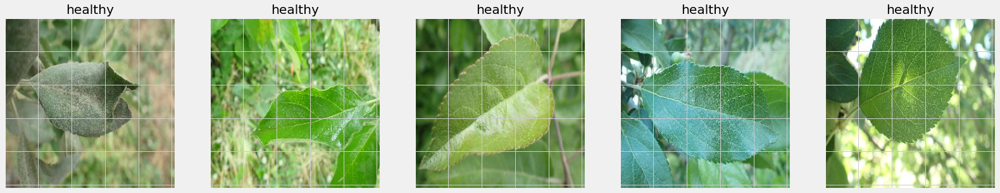

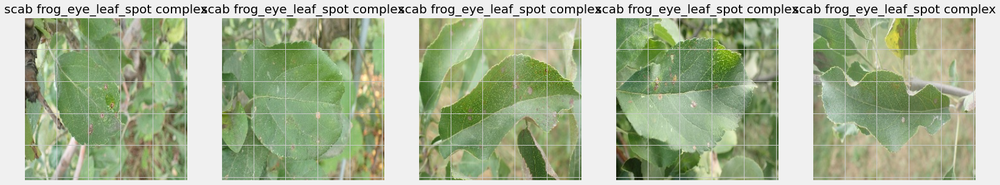

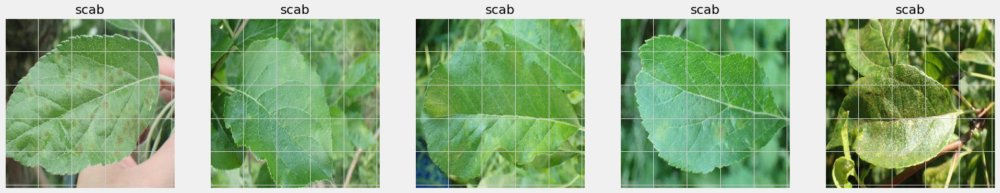

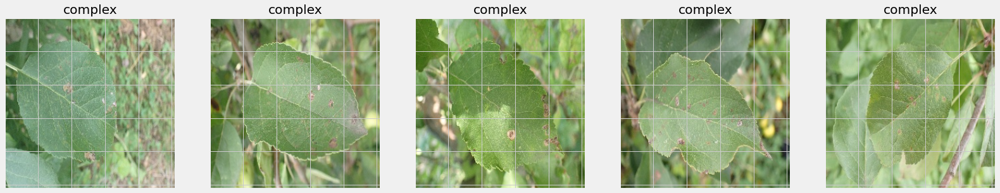

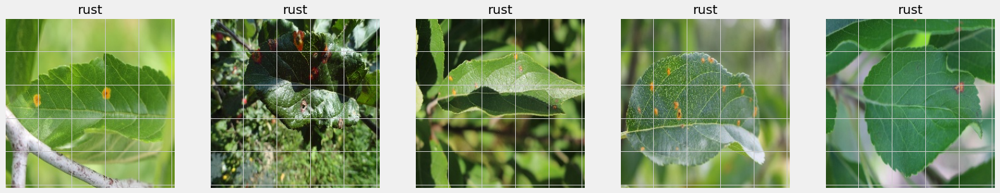

...

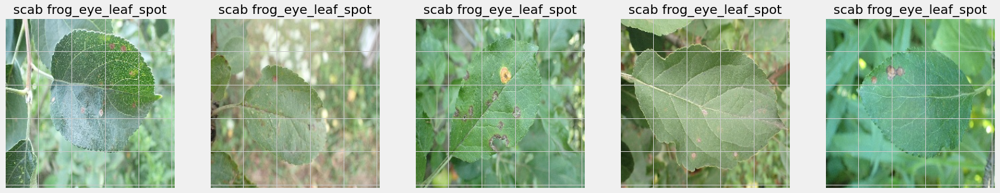

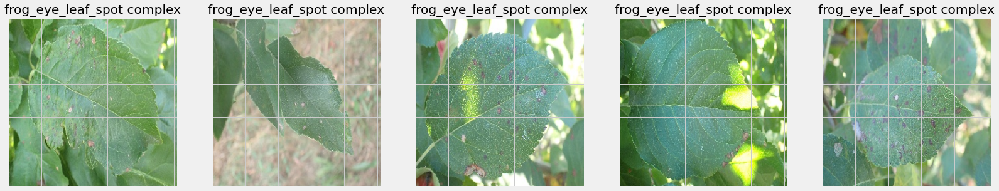

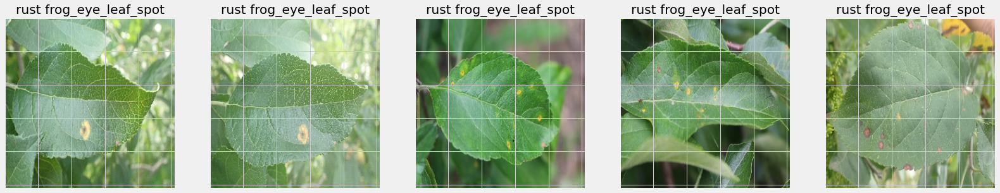

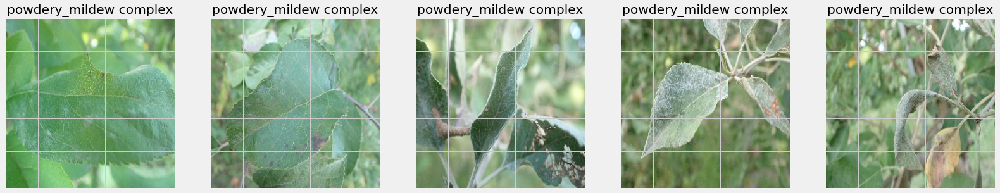

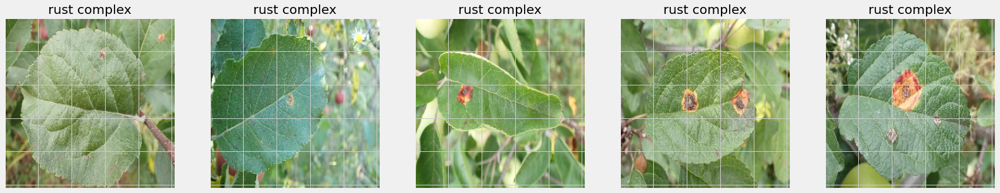

In [20]:
for labels in list(df['labels'].unique()):
    plot_examples(labels)

### Converting to multi-label problem

In [21]:
#https://www.kaggle.com/shanmukh05/plant-pathology-2k21-baseline-tpu-training

count_dict = df.labels.value_counts()
label2id = {
    'scab': 0,
    'frog_eye_leaf_spot' : 1,
    'rust' : 2,
    'complex' : 3,
    'powdery_mildew' : 4,
}
NUM_CLASS = len(label2id)
id2label = dict([(value, key) for key, value in label2id.items()])
df["labels"] = df["labels"].map(lambda x : [i for i in x.split(" ") if i != "healthy"])
df["labels"] = df["labels"].map(lambda x : [label2id[i] for i in x])
df.head()

,image,labels
0,800113bb65efe69e.jpg,[]
1,8002cb321f8bfcdf.jpg,"[0, 1, 3]"
2,80070f7fb5e2ccaa.jpg,[0]
3,80077517781fb94f.jpg,[0]
4,800cbf0ff87721f8.jpg,[3]


In [22]:
train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   rotation_range = 40,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                                   validation_split = 0.2)
test_datagen = ImageDataGenerator(rescale = 1./255,
                                  validation_split = 0.2)

In [23]:
train_generator = train_datagen.flow_from_dataframe(dataframe = df,
                                                   directory = DATA_TRAIN_IMAGES_256,
                                                   target_size = (256,256),
                                                   x_col = 'image',
                                                   y_col = 'labels',
                                                   batch_size = 128,
                                                   color_mode = 'rgb',
                                                   class_mode = 'categorical',
                                                   subset = 'training')

test_generator = test_datagen.flow_from_dataframe(dataframe = df,
                                                 directory = DATA_TRAIN_IMAGES_256,
                                                 target_size = (256,256),
                                                 x_col = 'image',
                                                 y_col = 'labels',
                                                 batch_size = 128,
                                                 color_mode = 'rgb',
                                                 class_mode = 'categorical',
                                                 subset = 'validation')

Found 14840 validated image filenames belonging to 5 classes.
Found 3709 validated image filenames belonging to 5 classes.


### First Model without Dropout

In [24]:
model_1 = Sequential([
    Conv2D(32, (3,3), input_shape=(256,256,3), activation='relu'),
    MaxPool2D(2,2),
   Conv2D(64, (3,3), activation='relu'),
    MaxPool2D(2,2),
    Conv2D(128, (3,3), activation='relu'),
    MaxPool2D(2,2),
    Conv2D(128, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPool2D(2,2),
    Conv2D(128, (3,3), activation='relu'),
    MaxPool2D(2,2),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(512, activation='relu'),
    Dense(NUM_CLASS, activation='sigmoid')
])
model_1.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 254, 254, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 127, 127, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 125, 125, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 62, 62, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 60, 60, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 30, 30, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 28, 28, 128)       1

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model_1, to_file='model_plot_nodropout.png', show_shapes=True, show_layer_names=True)

### Second Model with Dropout Layer

In [26]:
model_2 = Sequential([
    Conv2D(32, (3,3), input_shape=(256,256,3), activation='relu'),
    MaxPool2D(2,2),
   Conv2D(64, (3,3), activation='relu'),
    MaxPool2D(2,2),
    Conv2D(128, (3,3), activation='relu'),
    MaxPool2D(2,2),
    Conv2D(128, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPool2D(2,2),
    Conv2D(128, (3,3), activation='relu'),
    MaxPool2D(2,2),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.20),
    Dense(512, activation='relu'),
    Dense(NUM_CLASS, activation='sigmoid')
])
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 254, 254, 32)      896       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 127, 127, 32)      0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 125, 125, 64)      18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 62, 62, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 60, 60, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 30, 30, 128)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 28, 28, 128)      

### Creating Callback for the first baseline model

In [45]:
METRIC = "val_f1_score"

def create_callbacks_baseline(metric = METRIC):
    
    cpk_path = '/Users/ashis/Downloads/3 - Applied Machine Learning CPE 695A/Kaggle/ML Group Project - Dataset/baseline_model.h5'
    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(
        filepath=cpk_path,
        monitor= metric,
        mode='max',
        save_best_only=True,
        verbose=1,
    )

    reducelr = tf.keras.callbacks.ReduceLROnPlateau(
        monitor= metric,
        mode='max',
        factor=0.2,
        patience=3,
        verbose=1
    )

    earlystop = tf.keras.callbacks.EarlyStopping(
        monitor= metric,
        mode='max',
        patience=10, 
        verbose=1
    )
    
    callbacks = [checkpoint, reducelr, earlystop]         
    
    return callbacks

### Creating callback for the second Model (with dropout)

In [46]:
METRIC = "val_f1_score"

def create_callbacks_dropout(metric = METRIC):
    
    cpk_path = '/Users/ashis/Downloads/3 - Applied Machine Learning CPE 695A/Kaggle/ML Group Project - Dataset/baseline_model_dropout.h5'
    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(
        filepath=cpk_path,
        monitor= metric,
        mode='max',
        save_best_only=True,
        verbose=1,
    )

    reducelr = tf.keras.callbacks.ReduceLROnPlateau(
        monitor= metric,
        mode='max',
        factor=0.2,
        patience=3,
        verbose=1
    )

    earlystop = tf.keras.callbacks.EarlyStopping(
        monitor= metric,
        mode='max',
        patience=10, 
        verbose=1
    )
    
    callbacks = [checkpoint, reducelr, earlystop]         
    
    return callbacks

### Compile the First Model (Without Dropout)

In [41]:
from tensorflow.keras.optimizers import RMSprop,Adam
import tensorflow_addons as tfa

epochs = 40
batch_size = 256
optimizer_1 = Adam(lr = 0.001)
model_1.compile(optimizer = optimizer_1,
             loss = 'binary_crossentropy',
             metrics = ['accuracy', tfa.metrics.F1Score(num_classes = NUM_CLASS,average = "macro", name = "f1_score")])

### Compile the Second Model (With Dropout)

In [40]:
from tensorflow.keras.optimizers import RMSprop,Adam
import tensorflow_addons as tfa

epochs = 40
batch_size = 256
optimizer_2 = Adam(lr = 0.001)
model_2.compile(optimizer = optimizer_2,
             loss = 'binary_crossentropy',
             metrics = ['accuracy', tfa.metrics.F1Score(num_classes = NUM_CLASS,average = "macro", name = "f1_score")])

In [33]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 5341596648886595787
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 6959755424
locality {
  bus_id: 1
  links {
  }
}
incarnation: 4744775190462514746
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 2070 with Max-Q Design, pci bus id: 0000:01:00.0, compute capability: 7.5"
]


### Fit the first model on the training data 

In [47]:
callbacks_baseline = create_callbacks_baseline()
history_1 = model_1.fit(train_generator,epochs = epochs,validation_data = test_generator,verbose=1, callbacks = callbacks_baseline)

Epoch 1/40
116/116 [==============================] - 224s 2s/step - loss: 0.4203 - accuracy: 0.4801 - f1_score: 0.2879 - val_loss: 0.5570 - val_accuracy: 0.2332 - val_f1_score: 0.1680

Epoch 00001: val_f1_score improved from -inf to 0.16800, saving model to /Users/ashis/Downloads/3 - Applied Machine Learning CPE 695A/Kaggle/ML Group Project - Dataset\baseline_model.h5
Epoch 2/40
116/116 [==============================] - 159s 1s/step - loss: 0.3396 - accuracy: 0.6064 - f1_score: 0.4653 - val_loss: 0.5365 - val_accuracy: 0.2146 - val_f1_score: 0.1652

Epoch 00002: val_f1_score did not improve from 0.16800
Epoch 3/40
116/116 [==============================] - 157s 1s/step - loss: 0.2848 - accuracy: 0.7418 - f1_score: 0.5834 - val_loss: 0.3653 - val_accuracy: 0.6611 - val_f1_score: 0.4212

Epoch 00003: val_f1_score improved from 0.16800 to 0.42115, saving model to /Users/ashis/Downloads/3 - Applied Machine Learning CPE 695A/Kaggle/ML Group Project - Dataset\baseline_model.h5
Epoch 4/40
1

116/116 [==============================] - 158s 1s/step - loss: 0.1291 - accuracy: 0.7899 - f1_score: 0.7161 - val_loss: 0.1264 - val_accuracy: 0.8172 - val_f1_score: 0.7647

Epoch 00028: val_f1_score did not improve from 0.77624
Epoch 29/40
116/116 [==============================] - 156s 1s/step - loss: 0.1271 - accuracy: 0.7891 - f1_score: 0.7114 - val_loss: 0.1258 - val_accuracy: 0.8180 - val_f1_score: 0.7653

Epoch 00029: val_f1_score did not improve from 0.77624
Epoch 30/40
116/116 [==============================] - 160s 1s/step - loss: 0.1284 - accuracy: 0.7912 - f1_score: 0.7201 - val_loss: 0.1259 - val_accuracy: 0.8199 - val_f1_score: 0.7667

Epoch 00030: val_f1_score did not improve from 0.77624

Epoch 00030: ReduceLROnPlateau reducing learning rate to 3.200000264769187e-07.
Epoch 31/40
116/116 [==============================] - 158s 1s/step - loss: 0.1260 - accuracy: 0.7989 - f1_score: 0.7250 - val_loss: 0.1262 - val_accuracy: 0.8194 - val_f1_score: 0.7664

Epoch 00031: val_f

## Fit the second model on the train data

In [48]:
callbacks_dropout = create_callbacks_dropout()
history_2 = model_2.fit(train_generator,epochs = epochs,validation_data = test_generator,verbose=1, callbacks = callbacks_dropout)

Epoch 1/40
116/116 [==============================] - 159s 1s/step - loss: 0.4419 - accuracy: 0.4673 - f1_score: 0.2545 - val_loss: 0.5784 - val_accuracy: 0.1828 - val_f1_score: 0.1456

Epoch 00001: val_f1_score improved from -inf to 0.14558, saving model to /Users/ashis/Downloads/3 - Applied Machine Learning CPE 695A/Kaggle/ML Group Project - Dataset\baseline_model_dropout.h5
Epoch 2/40
116/116 [==============================] - 159s 1s/step - loss: 0.3429 - accuracy: 0.6007 - f1_score: 0.4748 - val_loss: 0.5519 - val_accuracy: 0.3478 - val_f1_score: 0.3067

Epoch 00002: val_f1_score improved from 0.14558 to 0.30674, saving model to /Users/ashis/Downloads/3 - Applied Machine Learning CPE 695A/Kaggle/ML Group Project - Dataset\baseline_model_dropout.h5
Epoch 3/40
116/116 [==============================] - 156s 1s/step - loss: 0.2863 - accuracy: 0.7389 - f1_score: 0.5817 - val_loss: 0.4209 - val_accuracy: 0.7401 - val_f1_score: 0.6204

Epoch 00003: val_f1_score improved from 0.30674 to 

116/116 [==============================] - 161s 1s/step - loss: 0.1375 - accuracy: 0.8038 - f1_score: 0.7207 - val_loss: 0.1407 - val_accuracy: 0.8212 - val_f1_score: 0.7644

Epoch 00027: val_f1_score did not improve from 0.77512

Epoch 00027: ReduceLROnPlateau reducing learning rate to 1.6000001778593287e-06.
Epoch 28/40
116/116 [==============================] - 155s 1s/step - loss: 0.1380 - accuracy: 0.8002 - f1_score: 0.7190 - val_loss: 0.1398 - val_accuracy: 0.8280 - val_f1_score: 0.7683

Epoch 00028: val_f1_score did not improve from 0.77512
Epoch 29/40
116/116 [==============================] - 151s 1s/step - loss: 0.1388 - accuracy: 0.8005 - f1_score: 0.7140 - val_loss: 0.1393 - val_accuracy: 0.8291 - val_f1_score: 0.7694

Epoch 00029: val_f1_score did not improve from 0.77512
Epoch 30/40
116/116 [==============================] - 151s 1s/step - loss: 0.1407 - accuracy: 0.7941 - f1_score: 0.7084 - val_loss: 0.1391 - val_accuracy: 0.8323 - val_f1_score: 0.7703

Epoch 00030: val_

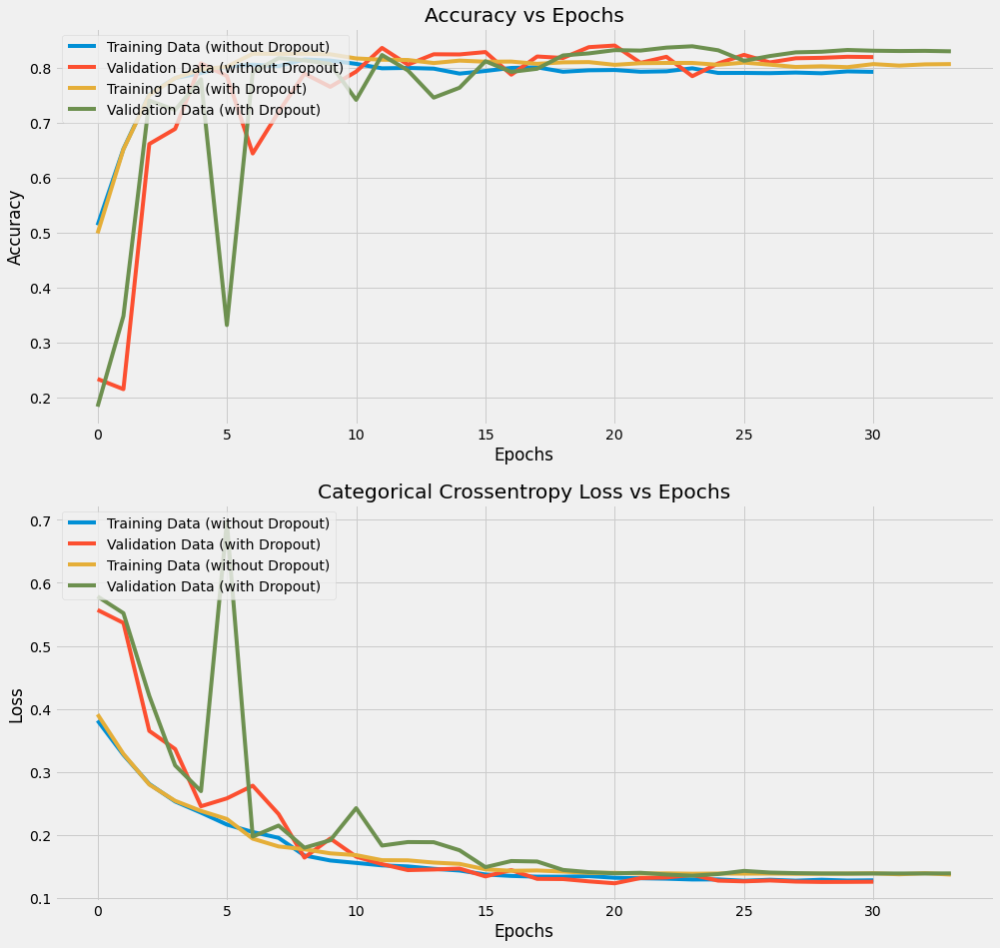

In [52]:
figure, axis = plt.subplots(2, 1, figsize=(15,15))

axis.ravel()

axis[0].plot(history_1.history['accuracy'],label='Training Data (without Dropout)')
axis[0].plot(history_1.history['val_accuracy'], label='Validation Data (without Dropout)')

axis[0].plot(history_2.history['accuracy'],label='Training Data (with Dropout)')
axis[0].plot(history_2.history['val_accuracy'], label='Validation Data (with Dropout)')

axis[0].set(xlabel='Epochs',ylabel='Accuracy', title='Accuracy vs Epochs')
axis[0].legend(loc="upper left")

plt.savefig('acc_vs_epoch.png')

axis[1].plot(history_1.history['loss'], label='Training Data (without Dropout)')
axis[1].plot(history_1.history['val_loss'], label='Validation Data (with Dropout)')

axis[1].plot(history_2.history['loss'], label='Training Data (without Dropout)')
axis[1].plot(history_2.history['val_loss'], label='Validation Data (with Dropout)')


axis[1].set(xlabel='Epochs',ylabel='Loss', title='Categorical Crossentropy Loss vs Epochs')
axis[1].legend(loc="upper left")

plt.savefig('loss_vs_epoch.png')

plt.show()

In [53]:
sequential_results_nodropout = {'train_loss':history_1.history['loss'],'train_accuracy':history_1.history['accuracy'],
                      'train_f1_score':history_1.history['f1_score'],'val_loss':history_1.history['val_loss'],
                      'val_accuracy':history_1.history['val_accuracy'],'val_f1_score':history_1.history['val_f1_score']}

sequential_results_dropout = {'train_loss':history_2.history['loss'],'train_accuracy':history_2.history['accuracy'],
                      'train_f1_score':history_2.history['f1_score'],'val_loss':history_2.history['val_loss'],
                      'val_accuracy':history_2.history['val_accuracy'],'val_f1_score':history_2.history['val_f1_score']}

In [54]:
sequential_results_nodropout = pd.DataFrame(sequential_results_nodropout)
sequential_results_dropout = pd.DataFrame(sequential_results_dropout)

In [55]:
sequential_results_nodropout.to_csv('sequential_results_nodropout.csv',index=False)
sequential_results_dropout.to_csv('sequential_results_dropout.csv',index=False)

# THE END